# Project 3: US Commodity Flow Survey

Group Members: Boer Feng, Chris Bunker, Patrick Steeves, Stella Lu 

# Part 1: Data Selection and Description

### Data Selection

For this project, our group decided to select data for US Commodities. The original dataset had over 4 million records in it which made it extremely slow to upload and analyze. We made the decision to reduce the number of records by just selecting the first 500,000 records. We believe this will still give a good sample for the year, especially because the data does not go in chronological order. By taking the first 500,000 we are taking a random sample.

The goal for this project is to see...

### Data Source

The original data was downloaded from the US Census: url
The reduced data we will use in this notebook can be found on github:

...

### Data Description

The medadata file for this data can be found here:

This data ... 

# <br><br>Part 2: Data Wrangling 

First we set up data files in the working directory.

In [1]:
pwd

'/home/jovyan/work'

In [2]:
!wget https://github.com/xinyicoco/ISTM_6212/raw/master/Final%20Project/Commodity_Flow_Survey.zip

--2016-12-09 01:56:47--  https://github.com/xinyicoco/ISTM_6212/raw/master/Final%20Project/Commodity_Flow_Survey.zip
Resolving github.com (github.com)... 192.30.253.113, 192.30.253.112
Connecting to github.com (github.com)|192.30.253.113|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/xinyicoco/ISTM_6212/master/Final%20Project/Commodity_Flow_Survey.zip [following]
--2016-12-09 01:56:48--  https://raw.githubusercontent.com/xinyicoco/ISTM_6212/master/Final%20Project/Commodity_Flow_Survey.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.32.133
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.32.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 22535628 (21M) [application/octet-stream]
Saving to: ‘Commodity_Flow_Survey.zip’

Commodity_Flow_Surv 100%[=====================>]  21.49M   102MB/s   in 0.2s   

2016-12-09 01:56:48 (102 MB/s) - ‘Comm

In [3]:
!unzip /home/jovyan/work/Commodity_Flow_Survey.zip

Archive:  /home/jovyan/work/Commodity_Flow_Survey.zip
  inflating: Commodity_Flow_Survey.csv  


In [4]:
!mv Commodity_Flow_Survey.csv CF.csv

<br> We then take a look at the number of rows and column statistics.

In [5]:
!wc -l CF.csv

1000001 CF.csv


In [6]:
!csvcut -n CF.csv

  1: SHIPMT_ID
  2: ORIG_STATE
  3: ORIG_MA
  4: ORIG_CFS_AREA
  5: DEST_STATE
  6: DEST_MA
  7: DEST_CFS_AREA
  8: NAICS
  9: QUARTER
 10: SCTG
 11: MODE
 12: SHIPMT_VALUE
 13: SHIPMT_WGHT
 14: SHIPMT_DIST_GC
 15: SHIPMT_DIST_ROUTED
 16: TEMP_CNTL_YN
 17: EXPORT_YN
 18: EXPORT_CNTRY
 19: HAZMAT
 20: WGT_FACTOR


In [7]:
!shuf -n 100000 CF.csv | csvstat

  1. 450111
	<class 'int'>
	Nulls: False
	Min: 37
	Max: 999999
	Sum: 50005705810
	Mean: 500062.0587205872
	Median: 501214
	Standard Deviation: 288378.2785926949
	Unique values: 99999
  2. 39
	<class 'int'>
	Nulls: False
	Min: 0
	Max: 56
	Sum: 2908035
	Mean: 29.080640806408063
	Median: 29
	Standard Deviation: 15.487854462825613
	Unique values: 52
	5 most frequent values:
		6:	7736
		48:	5886
		39:	4884
		42:	4649
		36:	4083
  3. 198
	<class 'int'>
	Nulls: False
	Min: 0
	Max: 99999
	Sum: 3828978472
	Mean: 38290.16762167621
	Median: 476
	Standard Deviation: 46866.59269968904
	Unique values: 72
	5 most frequent values:
		99999:	35698
		408:	4501
		348:	3361
		148:	2809
		176:	2791
  4. 39-198
	<class 'str'>
	Nulls: False
	Unique values: 169
	5 most frequent values:
		06-348:	3361
		17-176:	2267
		42-99999:	2050
		27-378:	1996
		55-99999:	1894
	Max length: 8
  5. 36
	<class 'int'>
	Nulls: False
	Min: 1
	Max: 56
	Sum: 2884883
	Mean: 28.84911849118491
	Median: 29
	Standard Deviation: 15.64006

As csvstat reveals, most of our columns have numeric values with no descriptions. The descriptions are in a Metadata file that we downloaded separately. So we know we will have to create dimension tables to describe these codes. One pleasant surprise was the little amount of null values in the dataset. In a random sample of 200,000 rows (20% of our dataset), we had no null values.

## <br>Trifacta

We also examined our data by importing it into Trifacta and realized that for the column SCTG, we had mismatched values (about 0.04% of our sample). Upon further exploration, it became clear that some values were coded according to a specific number, while others were an interval. This corresponds to two different ways of assigning a Standard Classification of Transported Goods code to a row (see screenshot of Metadata below).

In [8]:
from IPython.display import Image

In [9]:
!wget https://raw.githubusercontent.com/xinyicoco/ISTM_6212/master/Final%20Project/SCTG_codes.PNG

--2016-12-09 01:56:59--  https://raw.githubusercontent.com/xinyicoco/ISTM_6212/master/Final%20Project/SCTG_codes.PNG
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.32.133
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.32.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 55796 (54K) [image/png]
Saving to: ‘SCTG_codes.PNG’

SCTG_codes.PNG      100%[=====================>]  54.49K  --.-KB/s   in 0.002s 

2016-12-09 01:56:59 (25.8 MB/s) - ‘SCTG_codes.PNG’ saved [55796/55796]



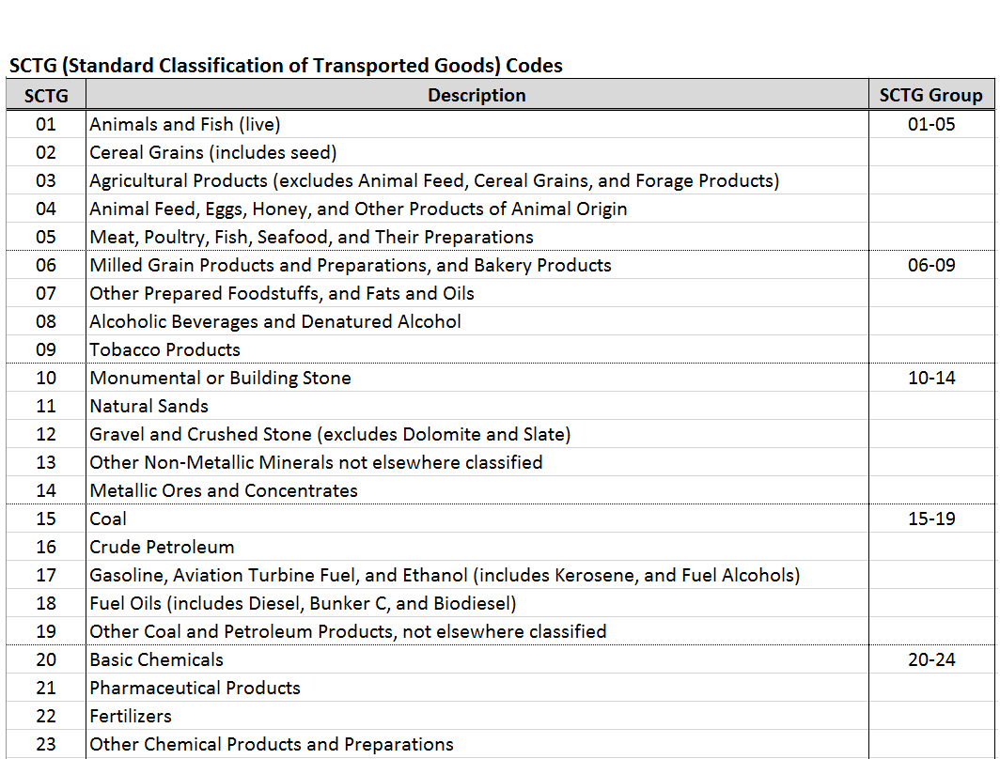

In [10]:
Image(filename = "SCTG_codes.PNG", width = 500, height = 500)

So some shipments were classified according to a single code and some were classified into a group. To normalize our data, we decided to classify all values of SCTG as groups. For instance, we changed SCTG values of 02 (Cereal Grains) to be in group 01-05, and 15 (Coal) in group 15-19. We then relabeled these groups 1 through 10. The Trifacta code that achieved this (with a nasty nested if statement) is below.

In [11]:
!wget https://raw.githubusercontent.com/xinyicoco/ISTM_6212/master/Final%20Project/wrangle_code.PNG

--2016-12-09 01:56:59--  https://raw.githubusercontent.com/xinyicoco/ISTM_6212/master/Final%20Project/wrangle_code.PNG
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.32.133
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.32.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 53731 (52K) [image/png]
Saving to: ‘wrangle_code.PNG’

wrangle_code.PNG    100%[=====================>]  52.47K  --.-KB/s   in 0.002s 

2016-12-09 01:56:59 (24.6 MB/s) - ‘wrangle_code.PNG’ saved [53731/53731]



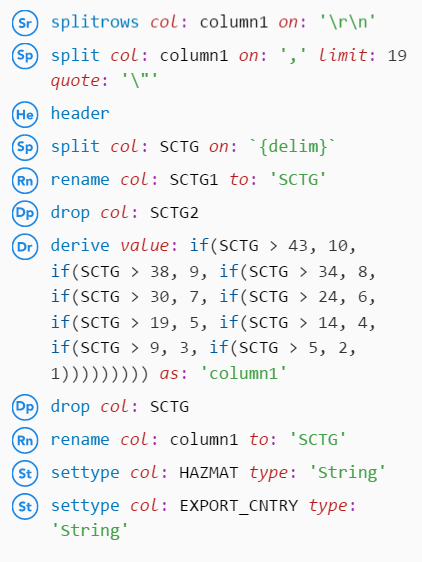

In [12]:
Image(filename = "wrangle_code.PNG", width = 300)

## <br><br>Commodity Flow Database

We will now build our database using postgresql.

In [13]:
%%sql
postgresql://dbuser@localhost:5432/projfinal DISONNECT ALL;

ERROR:root:Cell magic `%%sql` not found.


In [14]:
!echo 'redspot' | sudo -S service postgresql restart

[sudo] password for jovyan: Restarting PostgreSQL 9.5 database server: main.


In [15]:
!createdb -U dbuser projfinal

In [16]:
%load_ext sql

/opt/conda/lib/python3.5/site-packages/IPython/config.py:13: ShimWarning: The `IPython.config` package has been deprecated. You should import from traitlets.config instead.
  "You should import from traitlets.config instead.", ShimWarning)
/opt/conda/lib/python3.5/site-packages/IPython/utils/traitlets.py:5: UserWarning: IPython.utils.traitlets has moved to a top-level traitlets package.
  warn("IPython.utils.traitlets has moved to a top-level traitlets package.")


In [17]:
%sql postgresql://dbuser@localhost:5432/projfinal

'Connected: dbuser@projfinal'

We keep all columns of the csv file and import the values into our database.

In [18]:
%%sql
DROP TABLE IF EXISTS CF;
CREATE TABLE CF (
    SHIPMT_ID INTEGER,
    ORIG_STATE INTEGER,
    ORIG_MA INTEGER,
    ORIG_CFS_AREA VARCHAR (10),
    DEST_STATE INTEGER,
    DEST_MA INTEGER,
    DEST_CFS_AREA VARCHAR (10),
    NAICS INTEGER,
    QUARTER INTEGER,
    SCTG INTEGER,
    MODE INTEGER,
    SHIPMT_VALUE INTEGER,
    SHIPMT_WGHT INTEGER,
    SHIPMT_DIST_GC INTEGER,
    SHIPMT_DIST_ROUTED INTEGER,
    TEMP_CNTL_YN BOOLEAN,
    EXPORT_YN BOOLEAN,
    EXPORT_CNTRY CHAR (1),
    HAZMAT CHAR (1),
    WGT_FACTOR NUMERIC
);

Done.
Done.


[]

In [19]:
%%sql
COPY CF FROM '/home/jovyan/work/CF.csv'
CSV
HEADER
DELIMITER ',';

1000000 rows affected.


[]

To make sure that all shipment IDs are unique, we decided to drop the column and create a new serial column.

In [20]:
%%sql
ALTER TABLE CF
DROP COLUMN SHIPMT_ID;

Done.


[]

In [21]:
%%sql
ALTER TABLE CF
ADD COLUMN SHIPMT_ID BIGSERIAL;

Done.


[]

Next we check if all rows were imported properly.

In [22]:
%%sql
SELECT COUNT(*) FROM CF;

1 rows affected.


count
1000000


Next we take a quick look at the top states for exporting to make sure everything looks OK.

In [23]:
%%sql
SELECT orig_state, COUNT(*) AS count 
FROM CF
GROUP BY orig_state
ORDER BY count DESC
LIMIT 10;

10 rows affected.


orig_state,count
6,75526
48,58778
39,48460
42,45451
36,40565
12,37874
17,37541
26,33258
37,32467
18,31022


## <br><br>Create Star Schema

In [24]:
!wget https://raw.githubusercontent.com/xinyicoco/ISTM_6212/master/Final%20Project/star_schema_diagram.png

--2016-12-09 01:57:16--  https://raw.githubusercontent.com/xinyicoco/ISTM_6212/master/Final%20Project/star_schema_diagram.png
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.32.133
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.32.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 132378 (129K) [image/png]
Saving to: ‘star_schema_diagram.png’

star_schema_diagram 100%[=====================>] 129.28K  --.-KB/s   in 0.005s 

2016-12-09 01:57:16 (24.0 MB/s) - ‘star_schema_diagram.png’ saved [132378/132378]



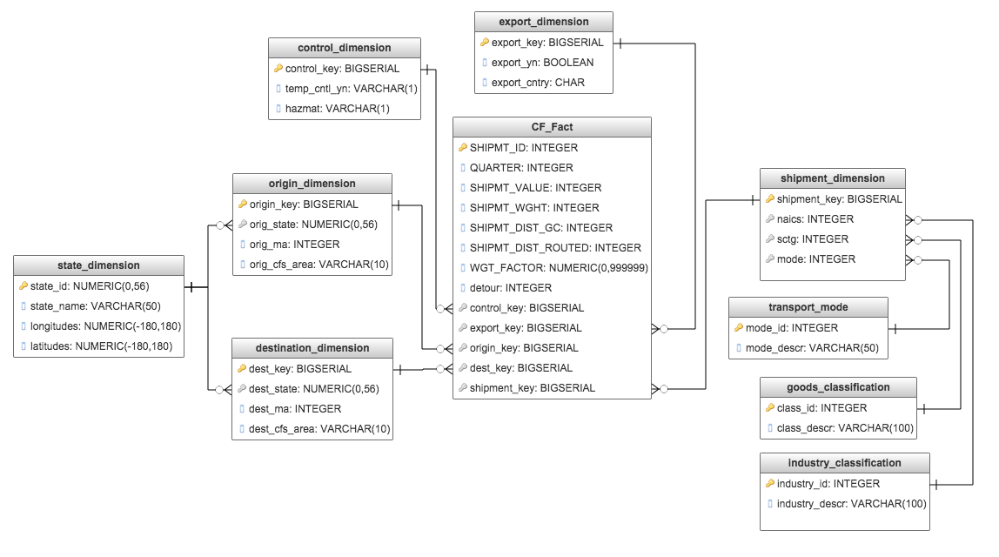

In [25]:
Image(filename = "star_schema_diagram.png", width = 1000, height = 1000)

To create our star schema we iterated over several fact tables, dropping certain columns and adding foreign keys to dimension tables as they were created. We create and populate our first fact table with all of the data from the original CF table.

In [26]:
%%sql
DROP TABLE IF EXISTS cf_fact2;
CREATE TABLE cf_fact2 AS
    (SELECT * FROM CF);

Done.
1000000 rows affected.


[]

Next, we create our first dimensional table that looks at content control. We import distinct values of temperature control and hazardous material classification and add a big serial columns as primary key to the table.

### <br>Control Dimension

In [27]:
%%sql
DROP TABLE IF EXISTS control_dimension CASCADE;
CREATE TABLE control_dimension AS
    SELECT DISTINCT
    temp_cntl_yn,
    hazmat
FROM CF;

Done.
6 rows affected.


[]

In [28]:
%%sql
ALTER TABLE control_dimension ADD COLUMN control_key BIGSERIAL PRIMARY KEY;

Done.


[]

### <br>Update Fact2 Table

We create a new fact table by selecting all columns except hazmat and temp_cntl_yn from the an inner join of the previous fact table and the control dimension table. We of course join on all columns of the dimension to make sure they match up with the fact table. We also add the values for control_key to the fact table, which will later be changed to a foreign key referncing the foreign dimension.

In [29]:
%%sql
DROP TABLE IF EXISTS cf_fact3;
CREATE TABLE cf_fact3 AS
(
SELECT f.shipmt_id, f.ORIG_STATE, f.ORIG_MA, f.ORIG_CFS_AREA, f.DEST_STATE, f.DEST_MA, f.DEST_CFS_AREA, f.NAICS, f.QUARTER,
    f.SCTG, f.MODE, f.SHIPMT_VALUE, F.SHIPMT_WGHT, SHIPMT_DIST_GC, SHIPMT_DIST_ROUTED, f.EXPORT_YN, f.EXPORT_CNTRY, f.WGT_FACTOR, d.control_key
FROM (SELECT * FROM control_dimension) AS d
INNER JOIN (SELECT * FROM cf_fact2) AS f
ON f.temp_cntl_yn = d.temp_cntl_yn
AND f.HAZMAT = d.hazmat
    )
;

Done.
1000000 rows affected.


[]

Next we do a quick sanity check of our new fact table.

In [30]:
%%sql
SELECT * FROM cf_fact3
LIMIT 5;

5 rows affected.


shipmt_id,orig_state,orig_ma,orig_cfs_area,dest_state,dest_ma,dest_cfs_area,naics,quarter,sctg,mode,shipmt_value,shipmt_wght,shipmt_dist_gc,shipmt_dist_routed,export_yn,export_cntry,wgt_factor,control_key
1,25,148,25-148,25,148,25-148,333,2,8,14,2178,11,14,17,False,N,208.5,4
2,42,428,42-428,6,41740,06-41740,311,3,8,14,344,11,2344,2734,False,N,193.3,4
3,26,220,26-220,47,314,47-314,322,2,6,4,4197,5134,470,579,False,N,51.2,4
4,20,556,20-556,20,556,20-556,323,1,6,4,116,6,3,3,False,N,238.7,4
5,12,99999,12-99999,12,99999,12-99999,4235,3,7,5,388,527,124,201,False,N,398.1,4


### <br>Export Dimension

For all the following dimension tables, the approach is the same as with the previous control dimension, so our steps should be easy to follow.

In [31]:
%%sql
DROP TABLE IF EXISTS export_dimension CASCADE;
CREATE TABLE export_dimension AS
    SELECT DISTINCT
    export_yn,
    export_cntry
FROM CF;

Done.
4 rows affected.


[]

In [32]:
%%sql
ALTER TABLE export_dimension ADD COLUMN export_key BIGSERIAL PRIMARY KEY;

Done.


[]

### <br>Update Fact3 Table

In [33]:
%%sql
DROP TABLE IF EXISTS cf_fact4;
CREATE TABLE cf_fact4 AS
(
SELECT f.SHIPMT_ID, f.ORIG_STATE, f.ORIG_MA, f.ORIG_CFS_AREA, f.DEST_STATE, f.DEST_MA, f.DEST_CFS_AREA,
    f.NAICS, f.QUARTER, f.SCTG, f.MODE, f.SHIPMT_VALUE, f.SHIPMT_WGHT, f.SHIPMT_DIST_GC, f.SHIPMT_DIST_ROUTED, f.WGT_FACTOR,
    f.control_key, d.export_key
FROM (SELECT * FROM export_dimension) AS d
INNER JOIN (SELECT * FROM cf_fact3) AS f
ON d.export_yn = f.export_yn
AND f.export_cntry = d.export_cntry
    )
;

Done.
1000000 rows affected.


[]

In [34]:
%%sql
SELECT * FROM cf_fact4
LIMIT 5;

5 rows affected.


shipmt_id,orig_state,orig_ma,orig_cfs_area,dest_state,dest_ma,dest_cfs_area,naics,quarter,sctg,mode,shipmt_value,shipmt_wght,shipmt_dist_gc,shipmt_dist_routed,wgt_factor,control_key,export_key
1,25,148,25-148,25,148,25-148,333,2,8,14,2178,11,14,17,208.5,4,4
2,42,428,42-428,6,41740,06-41740,311,3,8,14,344,11,2344,2734,193.3,4,4
3,26,220,26-220,47,314,47-314,322,2,6,4,4197,5134,470,579,51.2,4,4
4,20,556,20-556,20,556,20-556,323,1,6,4,116,6,3,3,238.7,4,4
5,12,99999,12-99999,12,99999,12-99999,4235,3,7,5,388,527,124,201,398.1,4,4


### <br>Origin Dimension

In [35]:
%%sql
DROP TABLE IF EXISTS origin_dimension CASCADE;
CREATE TABLE origin_dimension AS
    SELECT DISTINCT
    orig_state,
    orig_ma,
    orig_cfs_area
FROM CF;

Done.
169 rows affected.


[]

In [36]:
%%sql
ALTER TABLE origin_dimension ADD COLUMN origin_key BIGSERIAL PRIMARY KEY;

Done.


[]

### <br>Update Fact4 Table

In [37]:
%%sql
DROP TABLE IF EXISTS cf_fact5;
CREATE TABLE cf_fact5 AS
(
SELECT f.SHIPMT_ID, f.DEST_STATE, f.DEST_MA, f.DEST_CFS_AREA, f.NAICS, f.QUARTER, f.SCTG, f.MODE, f.SHIPMT_VALUE, 
    f.SHIPMT_WGHT, f.SHIPMT_DIST_GC, f.SHIPMT_DIST_ROUTED, f.WGT_FACTOR, f.control_key, f.export_key, d.origin_key
FROM (SELECT * FROM origin_dimension) AS d
INNER JOIN (SELECT * FROM cf_fact4) AS f
ON d.orig_state = f.orig_state
AND d.orig_ma = f.orig_ma
AND d.orig_cfs_area = f.orig_cfs_area
    )
;

Done.
1000000 rows affected.


[]

In [38]:
%%sql
SELECT * FROM cf_fact5
LIMIT 5;

5 rows affected.


shipmt_id,dest_state,dest_ma,dest_cfs_area,naics,quarter,sctg,mode,shipmt_value,shipmt_wght,shipmt_dist_gc,shipmt_dist_routed,wgt_factor,control_key,export_key,origin_key
1,25,148,25-148,333,2,8,14,2178,11,14,17,208.5,4,4,73
2,6,41740,06-41740,311,3,8,14,344,11,2344,2734,193.3,4,4,128
3,47,314,47-314,322,2,6,4,4197,5134,470,579,51.2,4,4,76
4,20,556,20-556,323,1,6,4,116,6,3,3,238.7,4,4,56
5,12,99999,12-99999,4235,3,7,5,388,527,124,201,398.1,4,4,35


### <br>Destination Dimension

In [39]:
%%sql
DROP TABLE IF EXISTS dest_dimension CASCADE;
CREATE TABLE dest_dimension AS
    SELECT DISTINCT
    dest_state,
    dest_ma,
    dest_cfs_area
FROM CF;

Done.
132 rows affected.


[]

In [40]:
%%sql
ALTER TABLE dest_dimension ADD COLUMN dest_key BIGSERIAL PRIMARY KEY;

Done.


[]

### <br>Update Fact5 Table

In [41]:
%%sql
DROP TABLE IF EXISTS cf_fact6;
CREATE TABLE cf_fact6 AS
(
SELECT f.SHIPMT_ID, f.NAICS, f.QUARTER, f.SCTG, f.MODE, f.SHIPMT_VALUE, f.SHIPMT_WGHT, f.SHIPMT_DIST_GC, 
    f.SHIPMT_DIST_ROUTED, f.WGT_FACTOR, f.control_key, f.export_key, f.origin_key, d.dest_key
FROM (SELECT * FROM dest_dimension) AS d
INNER JOIN (SELECT * FROM cf_fact5) AS f
ON d.dest_state = f.dest_state
AND d.dest_ma = f.dest_ma
AND d.dest_cfs_area = f.dest_cfs_area
    )
;

Done.
1000000 rows affected.


[]

In [42]:
%%sql
SELECT * FROM cf_fact6
LIMIT 5;

5 rows affected.


shipmt_id,naics,quarter,sctg,mode,shipmt_value,shipmt_wght,shipmt_dist_gc,shipmt_dist_routed,wgt_factor,control_key,export_key,origin_key,dest_key
1,333,2,8,14,2178,11,14,17,208.5,4,4,73,56
2,311,3,8,14,344,11,2344,2734,193.3,4,4,128,13
3,322,2,6,4,4197,5134,470,579,51.2,4,4,76,106
4,323,1,6,4,116,6,3,3,238.7,4,4,56,43
5,4235,3,7,5,388,527,124,201,398.1,4,4,35,27


### <br> Shipment dimension

In [43]:
%%sql
DROP TABLE IF EXISTS shipment_dimension CASCADE;
CREATE TABLE shipment_dimension AS
    SELECT DISTINCT
    naics,
    sctg,
    mode
FROM CF;

Done.
1957 rows affected.


[]

In [44]:
%%sql
ALTER TABLE shipment_dimension ADD COLUMN shipment_key BIGSERIAL PRIMARY KEY;

Done.


[]

In [45]:
%%sql
DROP TABLE IF EXISTS cf_fact;
CREATE TABLE cf_fact AS
(
SELECT f.SHIPMT_ID, f.QUARTER, f.SHIPMT_VALUE, f.SHIPMT_WGHT, f.SHIPMT_DIST_GC, 
    f.SHIPMT_DIST_ROUTED, f.WGT_FACTOR, f.control_key, f.export_key, f.origin_key, f.dest_key, d.shipment_key
FROM (SELECT * FROM shipment_dimension) AS d
INNER JOIN (SELECT * FROM cf_fact6) AS f
ON d.naics = f.naics
AND d.sctg = f.sctg
AND d.mode = f.mode
    )
;

Done.
1000000 rows affected.


[]

### <br> Final fact table

For the final fact table, we set all foreign keys to reference the appropriate dimension tables from above.

In [46]:
%%sql
ALTER TABLE cf_fact
ADD FOREIGN KEY (control_key) REFERENCES control_dimension(control_key),
ADD FOREIGN KEY (export_key) REFERENCES export_dimension(export_key),
ADD FOREIGN KEY (origin_key) REFERENCES origin_dimension(origin_key),
ADD FOREIGN KEY (dest_key) REFERENCES dest_dimension(dest_key),
ADD FOREIGN KEY (shipment_key) REFERENCES shipment_dimension(shipment_key);

Done.


[]

We then add a detour column that calculates the difference in actual distance shipped and great circle distance between origin and destination.

In [47]:
%%sql
ALTER TABLE cf_fact ADD COLUMN detour INTEGER;
UPDATE cf_fact SET detour = shipmt_dist_routed - shipmt_dist_gc;

Done.
1000000 rows affected.


[]

Lastly we drop the previous iterations of the fact table.

In [48]:
%%sql
DROP TABLE cf_fact2;
DROP TABLE cf_fact3;
DROP TABLE cf_fact4;
DROP TABLE cf_fact5;
DROP TABLE cf_fact6;

Done.
Done.
Done.
Done.
Done.


[]

## <br> Classification tables for states, transported goods, industries, and modes of transport

First, we will create the state dimension table that will consist of the state ID, the state name, and the latitude and longitude cooridinates for the center of each state. In the data the states are reference by number (0-56). These numbers account for out of country (0), the 50 states, and DC. For some reason, theres are numbers missing (i.e. 3 and 7) so that is where the extra numbers come from. We are going to make a reference table for the origin and destination dimension tables so that we can look at the data using state names rather than reference numbers.

In [49]:
%%sql
DROP TABLE IF EXISTS state_dimension;
CREATE TABLE state_dimension(
    state_id NUMERIC PRIMARY KEY,
    state_name VARCHAR (50),
    longitudes NUMERIC,
    latitudes NUMERIC
    )
;

Done.
Done.


[]

In [50]:
%%sql
INSERT INTO state_dimension (state_id, state_name, longitudes, latitudes)
VALUES (0, 'Out of Country', 0, 0), 
    (1, 'Alabama', 32.806671, -86.791130),
    (2, 'Alaska', 61.370716, -152.404419),
    (4, 'Arizona', 33.729759, -111.431221),
    (5, 'Arkansas', 34.969704, -92.373123),
    (6, 'California', 36.116203, -119.681564),
    (8, 'Colorado', 39.059811, -105.311104),
    (9, 'Connecticut', 41.597782, -72.755371),
    (10, 'Delaware', 39.318523, -75.507141),
    (11, 'DC', 38.897438, -77.026817),
    (12, 'Florida', 27.766279, -81.686783),
    (13, 'Georgia', 33.040619, -83.643074),
    (15, 'Hawaii', 21.094318, -157.498337),
    (16, 'Idaho', 44.240459, -114.478828),
    (17, 'Illinois', 40.349457, -88.986137),
    (18, 'Indiana', 39.849426, -86.258278),
    (19, 'Iowa', 42.011539, -93.210526),
    (20, 'Kansas', 38.526600, -96.726486),
    (21, 'Kentucky', 37.668140, -84.670067),
    (22, 'Louisiana', 31.169546, -91.867805),
    (23, 'Maine', 44.693947, -69.381927),
    (24, 'Maryland', 39.063946, -76.802101),
    (25, 'Massachusetts', 42.230171, -71.530106),
    (26, 'Michigan', 43.326618, -84.536095),
    (27, 'Minnesota', 45.694454, -93.900192),
    (28, 'Mississippi', 32.741646, -89.678696),
    (29, 'Missouri', 38.456085, -92.288368),
    (30, 'Montana', 46.921925, -110.454353),
    (31, 'Nebraska', 41.125370, -98.268082),
    (32, 'Nevada', 38.313515, -117.055374),
    (33, 'New Hampshire', 43.452492, -71.563896),
    (34, 'New Jersey',40.29890, -74.521011),
    (35, 'New Mexico', 34.840515, -106.248482),
    (36, 'New York', 42.165726, -74.948051),
    (37, 'North Carolina', 35.630066, -79.806419),
    (38, 'North Dakota', 47.528912, -99.784012),
    (39, 'Ohio', 40.388783, -82.764915),
    (40, 'Oklahoma', 35.565342, -96.928917),
    (41, 'Oregon', 44.572021, -122.070938),
    (42, 'Pennsylvania', 40.590752, -77.209755),
    (44, 'Rhode Island', 41.680893, -71.511780),
    (45, 'South Carolina', 33.856892, -80.945007),
    (46, 'South Dakota', 44.299782, -99.438828),
    (47, 'Tennessee', 35.747845, -86.692345),
    (48, 'Texas', 31.054487, -97.563461),
    (49, 'Utah', 40.150032, -111.862434),
    (50, 'Vermont', 44.045876, -72.710686),
    (51, 'Virginia', 37.769337, -78.169968),
    (53, 'Washington', 47.400902, -121.490494),
    (54, 'West Virgina', 38.491226, -80.954453),
    (55, 'Wisconsin', 44.268543, -89.616508),
    (56, 'Wyoming', 42.755966, -107.302490);

52 rows affected.


[]

In [51]:
%%sql
SELECT *
FROM state_dimension
LIMIT 10;

10 rows affected.


state_id,state_name,longitudes,latitudes
0,Out of Country,0,0
1,Alabama,32.806671,-86.791130
2,Alaska,61.370716,-152.404419
4,Arizona,33.729759,-111.431221
5,Arkansas,34.969704,-92.373123
6,California,36.116203,-119.681564
8,Colorado,39.059811,-105.311104
9,Connecticut,41.597782,-72.755371
10,Delaware,39.318523,-75.507141
11,DC,38.897438,-77.026817


Above, we check to make sure that the dimension was created properly.

Below, we add a foreign key to the origin and destination dimensions that link the state dimension by state ID.

In [52]:
%%sql
ALTER TABLE origin_dimension
ADD FOREIGN KEY (orig_state) REFERENCES state_dimension(state_id);

Done.


[]

In [53]:
%%sql
ALTER TABLE dest_dimension
ADD FOREIGN KEY (dest_state) REFERENCES state_dimension(state_id);

Done.


[]

<br>Now we can check to make sure that our dimension was created properly by doing a simple query.

In [54]:
%%sql
SELECT cf_fact.shipmt_value, cf_fact.shipmt_wght, origin_dimension.orig_state, state_dimension.state_name
FROM origin_dimension, state_dimension, cf_fact
WHERE cf_fact.origin_key = origin_dimension.origin_key
AND origin_dimension.orig_state = state_dimension.state_id
LIMIT 20;

20 rows affected.


shipmt_value,shipmt_wght,orig_state,state_name
10448,183703,38,North Dakota
10317,206350,38,North Dakota
15,49,25,Massachusetts
395,42011,54,West Virgina
1370,219254,18,Indiana
1017,402027,26,Michigan
3728,16568,54,West Virgina
411,76184,36,New York
1,31899,47,Tennessee
525,133709,39,Ohio


<br> We use the same method to create a dimension that defines the codes for transported goods in the shipment dimension.

In [55]:
%%sql
DROP TABLE IF EXISTS goods_classification;
CREATE TABLE goods_classification(
    class_id INTEGER PRIMARY KEY,
    class_descr VARCHAR (100)
    )
;

Done.
Done.


[]

In [56]:
%%sql
INSERT INTO goods_classification (class_id, class_descr)
VALUES
(1,'Animals, Animal Products, Agriculture'),
(2,'Prepared Foods, Alcohol, Tobacco'),
(3,'Raw Non-Metallic Building Materials'),
(4,'Coal, Petroleum, Gasoline'),
(5,'Chemicals, Pharmaceuticals, Plastic'),
(6,'Wood, Wood Products, Printed Materials'),
(7,'Metals, Minerals, Machinery'),
(8,'Electronics, Instruments, Vehicles'),
(9,'Other'),
(10,'Missing or Supressed')
;

10 rows affected.


[]

In [57]:
%%sql
SELECT * FROM goods_classification
;

10 rows affected.


class_id,class_descr
1,"Animals, Animal Products, Agriculture"
2,"Prepared Foods, Alcohol, Tobacco"
3,Raw Non-Metallic Building Materials
4,"Coal, Petroleum, Gasoline"
5,"Chemicals, Pharmaceuticals, Plastic"
6,"Wood, Wood Products, Printed Materials"
7,"Metals, Minerals, Machinery"
8,"Electronics, Instruments, Vehicles"
9,Other
10,Missing or Supressed


In [58]:
%%sql
ALTER TABLE shipment_dimension
ADD FOREIGN KEY (sctg) REFERENCES goods_classification(class_id);
SELECT * FROM shipment_dimension
LIMIT 10;

Done.
10 rows affected.


naics,sctg,mode,shipment_key
335,4,14,1
325,4,2,2
212,5,5,3
335,6,11,4
334,6,14,5
4238,9,11,6
337,6,15,7
333,5,4,8
4931,2,11,9
339,1,14,10


<br> Now we define the codes for industry classifications which are present in the shipment dimension.

In [59]:
%%sql
DROP TABLE IF EXISTS industry_classification;
CREATE TABLE industry_classification(
    industry_id INTEGER PRIMARY KEY,
    industry_descr VARCHAR (100)
    )
;

Done.
Done.


[]

In [60]:
%%sql
INSERT INTO industry_classification (industry_id, industry_descr)
VALUES
(212,'Mining (except oil and gas)'),
(311,'Food manufacturing'),
(312,'Beverage and tobacco product manufacturing'),
(313,'Textile mills'),
(314,'Textile product mills'),
(315,'Apparel manufacturing'),
(316,'Leather and allied product manufacturing'),
(321,'Wood product manufacturing'),
(322,'Paper manufacturing'),
(323,'Printing and related support activities'),
(324,'Petroleum and coal products manufacturing'),
(325,'Chemical manufacturing'),
(326,'Plastics and rubber products manufacturing'),
(327,'Nonmetallic mineral product manufacturing'),
(331,'Primary metal manufacturing'),
(332,'Fabricated metal product manufacturing'),
(333,'Machinery manufacturing'),
(334,'Computer and electronic product manufacturing'),
(335,'Electrical equipment, appliance, and component manufacturing'),
(336,'Transportation equipment manufacturing'),
(337,'Furniture and related product manufacturing'),
(339,'Miscellaneous manufacturing'),
(4231,'Motor vehicle and parts merchant wholesalers'),
(4232,'Furniture and home furnishing merchant wholesalers'),
(4233,'Lumber and other construction materials merchant wholesalers'),
(4234,'Commercial equip. merchant wholesalers'),
(4235,'Metal and mineral (except petroleum) merchant wholesalers'),
(4236,'Electrical and electronic goods merchant wholesalers'),
(4237,'Hardware and plumbing merchant wholesalers'),
(4238,'Machinery, equipment, and supplies merchant wholesalers'),
(4239,'Miscellaneous durable goods merchant wholesalers'),
(4241,'Paper and paper product merchant wholesalers'),
(4242,'Drugs and druggists'' sundries merchant wholesalers'),
(4243,'Apparel, piece goods, and notions merchant wholesalers'),
(4244,'Grocery and related product merchant wholesalers'),
(4245,'Farm product raw material merchant wholesalers'),
(4246,'Chemical and allied products merchant wholesalers'),
(4247,'Petroleum and petroleum products merchant wholesalers'),
(4248,'Beer, wine, and distilled alcoholic beverage merchant wholesalers'),
(4249,'Miscellaneous nondurable goods merchant wholesalers'),
(4541,'Electronic shopping and mail-order houses'),
(45431,'Direct selling establishments'),
(4931,'Warehousing and storage (includes 484)'),
(5111,'Newspaper, periodical, book, and directory publishers'),
(551114,'Corporate, subsidiary, and regional managing offices')
;

45 rows affected.


[]

In [61]:
%%sql
ALTER TABLE shipment_dimension
ADD FOREIGN KEY (naics) REFERENCES industry_classification(industry_id);
SELECT * FROM shipment_dimension
LIMIT 10;

Done.
10 rows affected.


naics,sctg,mode,shipment_key
335,4,14,1
325,4,2,2
212,5,5,3
335,6,11,4
334,6,14,5
4238,9,11,6
337,6,15,7
333,5,4,8
4931,2,11,9
339,1,14,10


<br> Finally, we create a table that defines the codes for modes of transport.

In [62]:
%%sql
DROP TABLE IF EXISTS transport_mode;
CREATE TABLE transport_mode(
    mode_id INTEGER PRIMARY KEY,
    mode_descr VARCHAR (50)
    )
;

Done.
Done.


[]

In [63]:
%%sql
INSERT INTO transport_mode 
VALUES
(02,'Single mode'),
(03,'Truck'),
(04,'For-hire truck'),
(05,'Private truck'),
(06,'Rail'),
(07,'Water'),
(08,'Inland Water'),
(09,'Great Lakes'),
(10,'Deep Sea'),
(101,'Multiple Waterways'),
(11,'Air (incl truck & air)'),
(12,'Pipeline'),
(13,'Multiple mode'),
(14,'Parcel, USPS, or courier'),
(20,'Non-parcel multimode'),
(15,'Truck and rail'),
(16,'Truck and water'),
(17,'Rail and water'),
(18,'Other multiple mode'),
(19,'Other mode'),
(00,'Mode suppressed')
;


21 rows affected.


[]

In [64]:
%%sql
ALTER TABLE shipment_dimension
ADD FOREIGN KEY (mode) REFERENCES transport_mode(mode_id);

Done.


[]

In [65]:
%%sql
SELECT * FROM transport_mode
LIMIT 10;

10 rows affected.


mode_id,mode_descr
2,Single mode
3,Truck
4,For-hire truck
5,Private truck
6,Rail
7,Water
8,Inland Water
9,Great Lakes
10,Deep Sea
101,Multiple Waterways


# Part 3: Data Analysis

## State Export and Import Analysis

First, we want to analyze which states export the most commodities. 

In [66]:
%%sql
SELECT state_name, COUNT(shipmt_id) AS StateShipments
FROM cf_fact, state_dimension, origin_dimension
WHERE cf_fact.origin_key = origin_dimension.origin_key
AND origin_dimension.orig_state = state_dimension.state_id
GROUP BY state_dimension.state_name
ORDER BY StateShipments DESC
;

52 rows affected.


state_name,stateshipments
California,75526
Texas,58778
Ohio,48460
Pennsylvania,45451
New York,40565
Florida,37874
Illinois,37541
Michigan,33258
North Carolina,32467
Indiana,31022


/opt/conda/lib/python3.5/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')
/opt/conda/lib/python3.5/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')


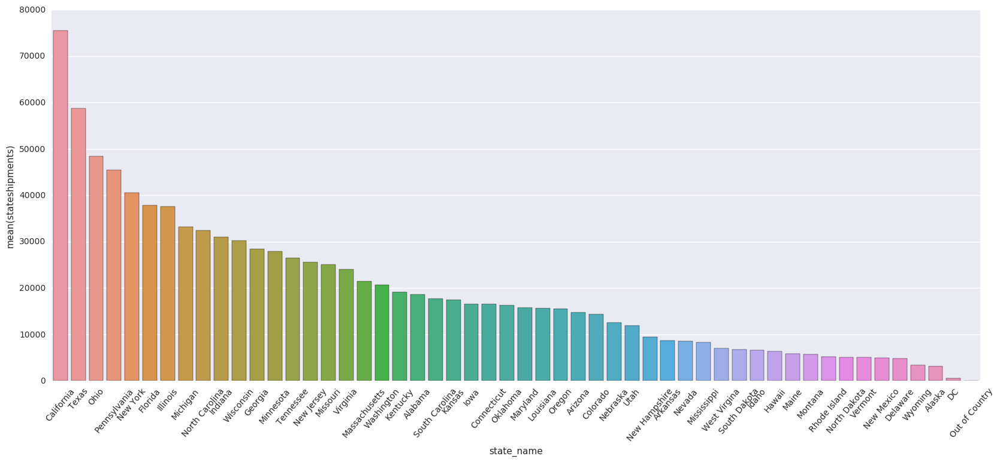

In [67]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
from matplotlib import rc

d = _.DataFrame()
rc('figure', figsize=(20, 8))
splt = sns.barplot(x='state_name', y='stateshipments', data=d)
labels = [l for l in splt.get_xmajorticklabels()]
splt.set_xticklabels(labels, rotation=50)

Not surpisingly, California and Texas are the largest exporters while Wyoming, Alaska, and DC are the smallest. 

Next, we will do the same analysis for imports, we expect to get very similar results.

In [68]:
%%sql
SELECT state_name, COUNT(shipmt_id) AS StateShipments
FROM cf_fact, state_dimension, dest_dimension
WHERE cf_fact.origin_key = dest_dimension.dest_key
AND dest_dimension.dest_state = state_dimension.state_id
GROUP BY state_dimension.state_name
ORDER BY StateShipments DESC
;

51 rows affected.


state_name,stateshipments
Texas,69622
California,57365
New York,46005
Kentucky,37443
Pennsylvania,30485
Indiana,28445
South Carolina,26115
Tennessee,24763
Wisconsin,24531
Colorado,23879


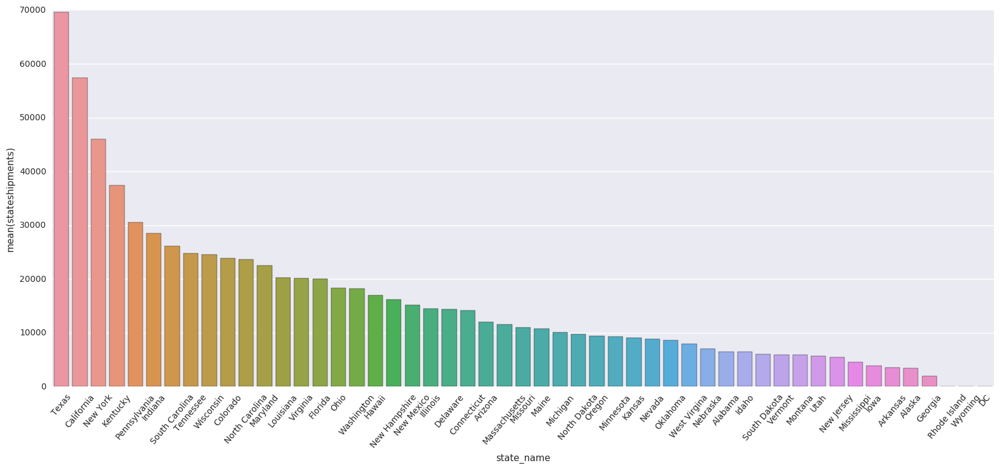

In [69]:
d = _.DataFrame()
rc('figure', figsize=(20, 8))
splt = sns.barplot(x='state_name', y='stateshipments', data=d)
labels = [l for l in splt.get_xmajorticklabels()]
splt.set_xticklabels(labels, rotation=50)

Not surpisingly, Texas and California are the largest importers. It is also not surpirising that New York is third because of New York City. The smallest importers are Rhode Island, Wyoming, and DC, which makes sense due to population size. 

## Shipment Analysis

For shipments, we want to see which types of shipments occur the most. We found it interesting that metals, minerals, and machinery topped the list, followed by wood and electronics.

In [70]:
%%sql
SELECT class_descr, COUNT (shipmt_id)
FROM goods_classification, cf_fact, shipment_dimension
WHERE cf_fact.shipment_key = shipment_dimension.shipment_key
AND shipment_dimension.sctg = goods_classification.class_id
GROUP BY class_descr
ORDER BY count DESC;

10 rows affected.


class_descr,count
"Metals, Minerals, Machinery",191115
"Wood, Wood Products, Printed Materials",163263
"Electronics, Instruments, Vehicles",149125
Other,149037
"Chemicals, Pharmaceuticals, Plastic",140582
"Prepared Foods, Alcohol, Tobacco",77764
"Coal, Petroleum, Gasoline",53577
"Animals, Animal Products, Agriculture",42070
Raw Non-Metallic Building Materials,33463
Missing or Supressed,4


## Transport Analysis

For our transport analysis, we want to examine the modes of transportation and their frequency. As seen in the graph below, trucking (both private and commercial) makes up a vast majority of the modes of transportation.

In [71]:
%%sql
SELECT mode_descr, COUNT (shipmt_id)
FROM transport_mode, cf_fact, shipment_dimension
WHERE cf_fact.shipment_key = shipment_dimension.shipment_key
AND shipment_dimension.mode = transport_mode.mode_id
GROUP BY mode_descr
ORDER BY count DESC
;

21 rows affected.


mode_descr,count
Private truck,355989
For-hire truck,353787
"Parcel, USPS, or courier",256948
Air (incl truck & air),14995
Rail,8529
Truck and rail,4353
Single mode,1628
Multiple mode,1070
Pipeline,838
Inland Water,576


Before running the rest of our analysis, we pause IPython kernel for 5 seconds. We had a lot of trouble with the kernel dying and this seemed to solve the problem most of the time.

## <br> Relationship between weight and value

We want to see if there is any correlation between shipment value and shipment weight. That is, we want to see if shipments become more valuable as they increase in weight. Below we use numpy, matplotlib, and pandas to do some regression analysis.

In [72]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

We pause for 5 seconds here because the size of our queries often cause the kernel to die, and this seems to solve the problem most of the time.

In [73]:
import time
time.sleep(5)

Randomly select 15% of our data, because a higher percentage crashed our notebook. We also wanted to discard major outliers (value or weight > 100,000,000).

In [74]:
%%sql
SELECT shipmt_value, shipmt_wght
FROM cf_fact TABLESAMPLE BERNOULLI(15)
WHERE shipmt_value < 100000000
AND shipmt_wght < 100000000
;

150611 rows affected.


shipmt_value,shipmt_wght
10317,206350
1017,402027
1,31899
525,133709
2072,820713
9203676,425
1873,227755
369,245848
3732,181346
237,41729


In [75]:
weight_value = _.DataFrame()
weight = weight_value.as_matrix()[:,1]
value = weight_value.as_matrix()[:,0]

We calculated the correlation coefficient between the two variables. Since we collected a random sample, the coefficient changed, but it usually ranged from 0.25 to 0.5.

In [76]:
np.corrcoef(weight,value)[0,1]

0.23832555737363695

Below is a scatterplot of this data. Most of the data follows a general trend that is slightly increasing above the x-axis, but there exist goods of very high value and low weight. We hypothesize that these might be things like very high-tech equipment.

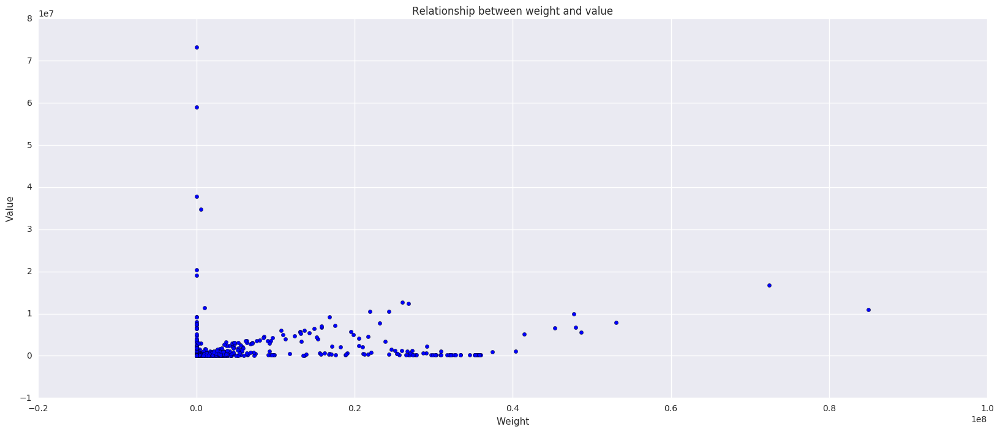

In [77]:
plt.scatter(weight, value)
plt.xlabel('Weight')
plt.ylabel('Value')
plt.title('Relationship between weight and value')

We also wanted to look at the most valuable goods shipped and their classifications. As shown below, there was a shipment worth over half a billion dollars, and almost half of the goods of highest value were in the Electronics, Instruments, Vehicles and the Chemicals category.

In [78]:
%%sql
SELECT MAX(shipmt_value), cf_fact.shipment_key, class_descr
FROM cf_fact, shipment_dimension, goods_classification
WHERE cf_fact.shipment_key = shipment_dimension.shipment_key
AND shipment_dimension.sctg = goods_classification.class_id
GROUP BY cf_fact.shipment_key, class_descr
ORDER BY max DESC
LIMIT 10;

10 rows affected.


max,shipment_key,class_descr
521277800,1798,"Electronics, Instruments, Vehicles"
158525900,1854,"Electronics, Instruments, Vehicles"
59040700,1125,Other
46697728,1708,"Electronics, Instruments, Vehicles"
42659767,653,"Coal, Petroleum, Gasoline"
42072318,577,"Animals, Animal Products, Agriculture"
41895106,1305,"Chemicals, Pharmaceuticals, Plastic"
41809908,287,"Chemicals, Pharmaceuticals, Plastic"
35167344,324,"Electronics, Instruments, Vehicles"
33602385,1100,"Coal, Petroleum, Gasoline"


## <br> Exploring Route Detours

Below we looked at which modes of transportation led to the longest detours, relative to the distance between origin and destination.

In [79]:
%%sql
SELECT mode_descr, AVG(CAST(CAST(detour AS NUMERIC(10,4)) / CAST(shipmt_dist_gc AS NUMERIC(10,4)) AS NUMERIC(7,3))) AS relative_detour
FROM cf_fact, shipment_dimension, transport_mode
WHERE cf_fact.shipment_key = shipment_dimension.shipment_key
AND shipment_dimension.mode = transport_mode.mode_id
GROUP BY mode_descr
ORDER BY relative_detour DESC;

21 rows affected.


mode_descr,relative_detour
Air (incl truck & air),4.1685077025675225
Great Lakes,1.3301578947368421
Other multiple mode,1.2920000000000000
Rail and water,0.95765217391304347826
Single mode,0.91272665847665847666
Multiple Waterways,0.79661538461538461538
Inland Water,0.77626562500000000000
Truck and water,0.63168965517241379310
"Parcel, USPS, or courier",0.61858182200289552750
Multiple mode,0.61495233644859813084


As our results show, on average, shipment by air led to over a 300% longer route than the theoretical great circle distance between origin and destination. That is a huge number, therefore we took a closer look at the numbers behind this below. The transport mode code for air is 11.

In [80]:
%%sql
SELECT (CAST(CAST(detour AS NUMERIC(10,4)) / CAST(shipmt_dist_gc AS NUMERIC(10,4)) AS NUMERIC(7,3))) AS relative_detour, shipmt_dist_routed, shipmt_dist_gc
FROM cf_fact, shipment_dimension
WHERE shipment_dimension.mode = 11
AND cf_fact.shipment_key = shipment_dimension.shipment_key
ORDER BY relative_detour DESC;

14995 rows affected.


relative_detour,shipmt_dist_routed,shipmt_dist_gc
553.333,1663,3
550.500,1103,2
532.000,2132,4
532.000,2132,4
530.000,1062,2
459.750,1843,4
459.750,1843,4
459.750,1843,4
410.500,823,2
410.500,823,2


According to the data, there are several goods that are transported between two points that are less than 10 miles apart, but that take a route longer than 1,000 miles to get there (sometimes longer than 2,000). We think that this is some type of data input error, perhaps that a decimal point was dropped somewhere, because this seems infeasible and extremely wasteful.

## <br>Map of states with most activity

Above we explored the import and exports of states, but we also wanted to show state activity in a more interesting way. We decided to create a map comparing the levels of total goods transported to and from states.

In [81]:
%%sql
SELECT state_name, longitudes, latitudes, COUNT(shipmt_id) AS AsDestination
FROM cf_fact, state_dimension, dest_dimension
WHERE cf_fact.dest_key = dest_dimension.dest_key
AND dest_dimension.dest_state = state_dimension.state_id
GROUP BY state_dimension.state_name, longitudes, latitudes
ORDER BY state_name ASC
;

51 rows affected.


state_name,longitudes,latitudes,asdestination
Alabama,32.806671,-86.791130,17052
Alaska,61.370716,-152.404419,3733
Arizona,33.729759,-111.431221,16375
Arkansas,34.969704,-92.373123,9360
California,36.116203,-119.681564,82626
Colorado,39.059811,-105.311104,15187
Connecticut,41.597782,-72.755371,13422
DC,38.897438,-77.026817,1476
Delaware,39.318523,-75.507141,4200
Florida,27.766279,-81.686783,43671


In [82]:
d1 = _.DataFrame()

In [83]:
%%sql
SELECT state_name, COUNT(shipmt_id) AS AsOrigin
FROM cf_fact, state_dimension, origin_dimension
WHERE cf_fact.origin_key = origin_dimension.origin_key
AND origin_dimension.orig_state = state_dimension.state_id
GROUP BY state_dimension.state_name
ORDER BY state_name ASC
;

52 rows affected.


state_name,asorigin
Alabama,18658
Alaska,3138
Arizona,14700
Arkansas,8713
California,75526
Colorado,14392
Connecticut,16591
DC,519
Delaware,4844
Florida,37874


Since we do not have data (or coordinates) for Out of Country exports, we dropped that row below.

In [84]:
d2 = _.DataFrame()
d2 = d2[d2.state_name != 'Out of Country']

In [85]:
volume = np.hstack((d1.as_matrix()[:], d2.as_matrix()[:,1].reshape(51,1)))

Below is a look at the array we pulled from our database

In [86]:
volume[:5,]

array([['Alabama', Decimal('32.806671'), Decimal('-86.791130'), 17052,
        18658],
       ['Alaska', Decimal('61.370716'), Decimal('-152.404419'), 3733, 3138],
       ['Arizona', Decimal('33.729759'), Decimal('-111.431221'), 16375,
        14700],
       ['Arkansas', Decimal('34.969704'), Decimal('-92.373123'), 9360, 8713],
       ['California', Decimal('36.116203'), Decimal('-119.681564'), 82626,
        75526]], dtype=object)

Add imports and exports of each state together.

In [87]:
total = np.array(volume[:,3]+volume[:,4])

Add total to our array

In [88]:
data = np.hstack((volume,total.reshape((51,1))))

Plot a map of the US using the latitude and longitude columns, and the total column as the color coding scheme

(20, 63)

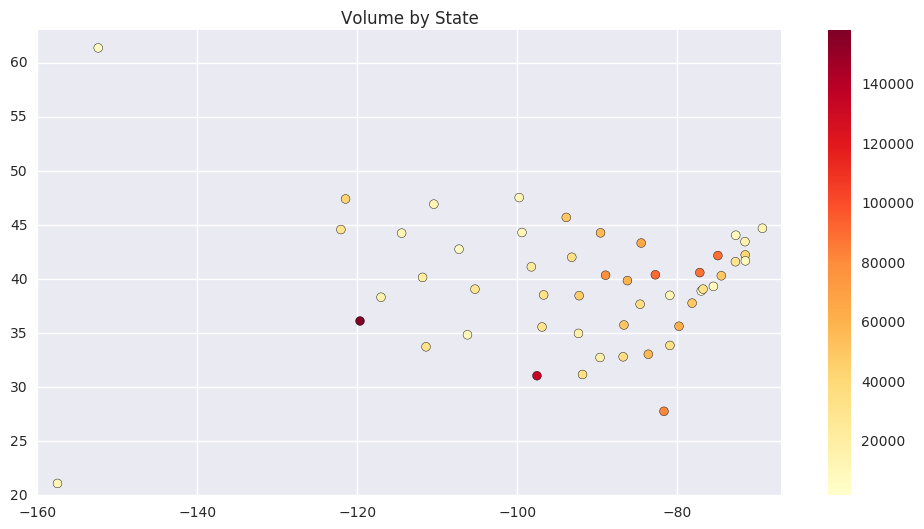

In [89]:
plt.figure(figsize=(12,6))

plt.scatter(data[:,2], data[:,1], c=data[:,5],cmap = "YlOrRd", s = 40)
plt.title('Volume by State')
plt.colorbar()
plt.xlim([-160,-67])
plt.ylim([20,63])

The map above takes the shape of the US (with Hawaii in the bottom left corner and Alaska in the top right). As expected, California and Texas are the darkest points, and states such as Alaska and Wyoming are the lightest shade.

# Bonus

For the bonus part of the project, please run the Bonus.ipynb notebook. If run after this one, it will be reproducible because it connects to the database created and connected to in this notebook.